In [1]:
# source: https://covid.ourworldindata.org/data/owid-covid-data.csv
import numpy as np
import pandas as pd
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
os.makedirs('plots/country', exist_ok=True)
plt.style.use('ggplot')
mpl.rcParams['axes.titlesize'] = 36
mpl.rcParams['axes.labelsize'] = 16
mpl.rcParams['xtick.labelsize']=12
mpl.rcParams['ytick.labelsize']=12
mpl.rcParams['legend.fontsize']=12
#print(mpl.rcParams.keys())
df = pd.read_csv('owid-covid-data.csv', parse_dates=['date'], infer_datetime_format=True)
df = df.sort_values(by=['location', 'date'])
df['new_deaths_per_million_moving_avg'] = df.groupby('location')['new_deaths_per_million'].transform(lambda x: x.rolling(7, 1).mean())
df['new_cases_per_million_moving_avg'] = df.groupby('location')['new_cases_per_million'].transform(lambda x: x.rolling(7, 1).mean())
df['new_tests_per_thousand_moving_avg'] = df.groupby('location')['new_tests_per_thousand'].transform(lambda x: x.rolling(7, 1).mean())
print(df.columns)
print(df['location'].unique())
df.info()

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'total_deaths', 'new_deaths', 'total_cases_per_million',
       'new_cases_per_million', 'total_deaths_per_million',
       'new_deaths_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'tests_units',
       'stringency_index', 'population', 'population_density', 'median_age',
       'aged_65_older', 'aged_70_older', 'gdp_per_capita', 'extreme_poverty',
       'cvd_death_rate', 'diabetes_prevalence', 'female_smokers',
       'male_smokers', 'handwashing_facilities', 'hospital_beds_per_thousand',
       'life_expectancy', 'new_deaths_per_million_moving_avg',
       'new_cases_per_million_moving_avg',
       'new_tests_per_thousand_moving_avg'],
      dtype='object')
['Afghanistan' 'Albania' 'Algeria' 'Andorra' 'Angola' 'Anguilla'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Aus

In [2]:
def plot_country(df, country, important_dates=None, show=True, plot_tests=False):
    df = df.loc[df['location']==country]
    fig = plt.figure(figsize=(12,8))
    ax = fig.add_subplot(111)
    ax.plot(df['date'], df['new_cases_per_million_moving_avg']/10**6, color='blue', linestyle='--', label='new cases (% of pop)')
    ax.plot(df['date'], df['total_cases_per_million']/10**6, color='blue', linestyle='-', label='total cases (% of pop)')
    ax.plot(df['date'], df['new_deaths_per_million_moving_avg']/10**6, color='red', linestyle='--', label='new deaths (% of pop)')
    ax.plot(df['date'], df['total_deaths_per_million']/10**6, color='red', linestyle='-', label='total deaths (% of pop)')
    if plot_tests:
        ax.plot(df['date'], df['new_tests_per_thousand_moving_avg']/10**3, color='green', linestyle='--', label='new tests (% of pop)')
    if important_dates is not None:
        for d in important_dates:
            ax.axvline(d, color='black', linestyle='--')
    ax.set_yscale('log')
    ax.set_title(country)
    ax.set_xlabel('Date')
    ax.set_ylabel('Percent of Population')
    ax.legend()
    fig.savefig(f'plots/country/{country.lower().replace(" ", "_")}.png')
    if show:
        plt.show()


c:\users\scott\appdata\local\programs\python\python37\lib\site-packages\pandas\plotting\_matplotlib\converter.py:102: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


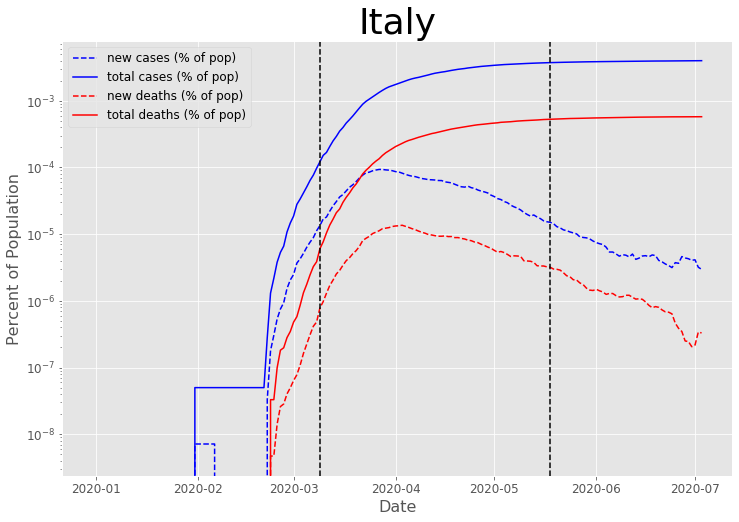

In [3]:
plot_country(df, 'Italy', ['3/9/2020', '5/18/2020'])

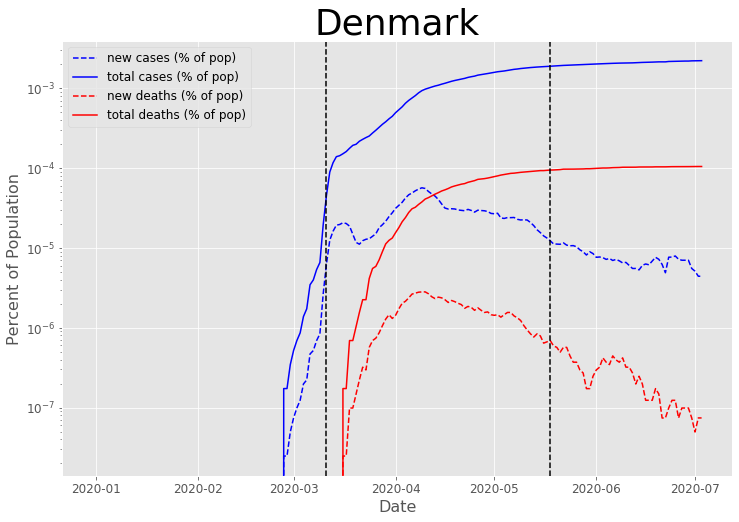

In [4]:
plot_country(df, 'Denmark', ['3/11/2020', '5/18/2020'])

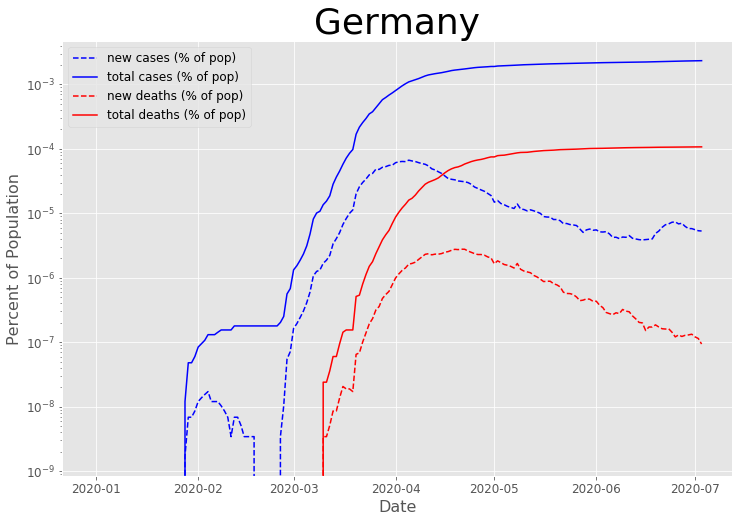

In [142]:
plot_country(df, 'Germany')

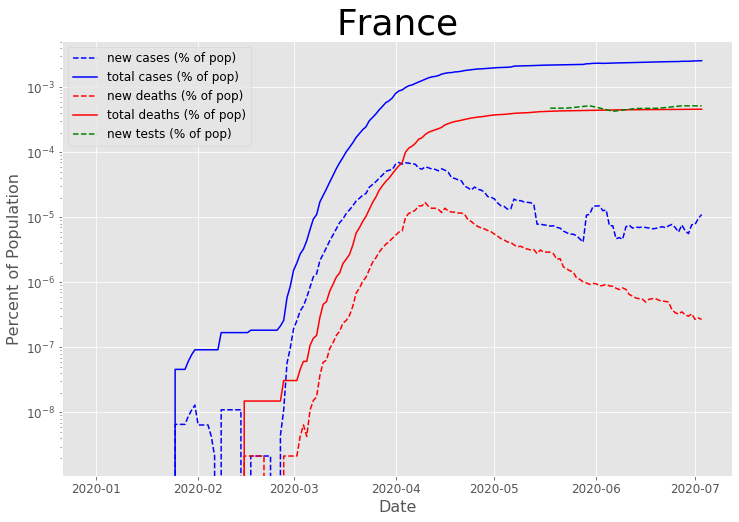

In [157]:
plot_country(df, 'France', plot_tests=True)

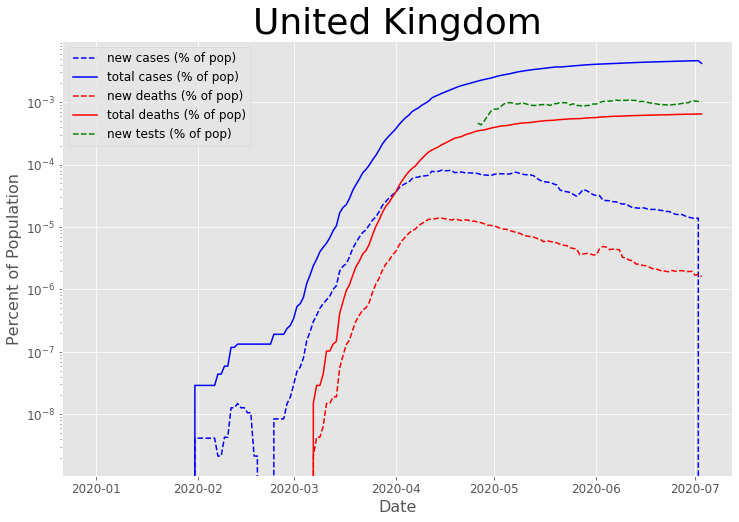

In [159]:
plot_country(df, 'United Kingdom', plot_tests=True)

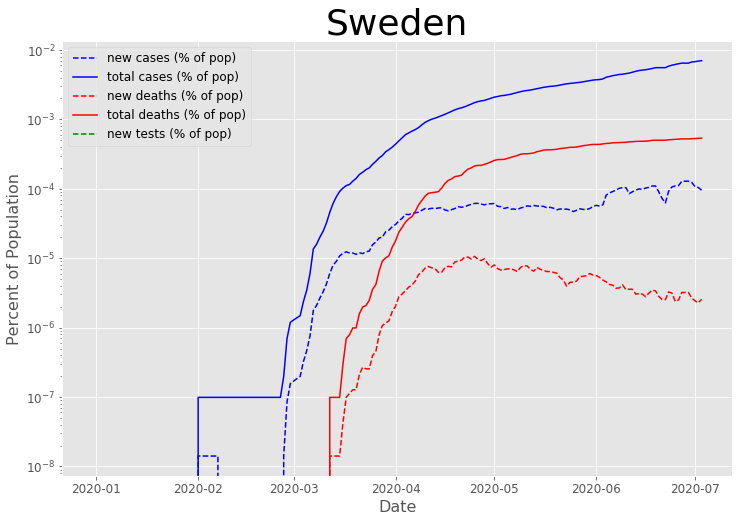

In [156]:
plot_country(df, 'Sweden')

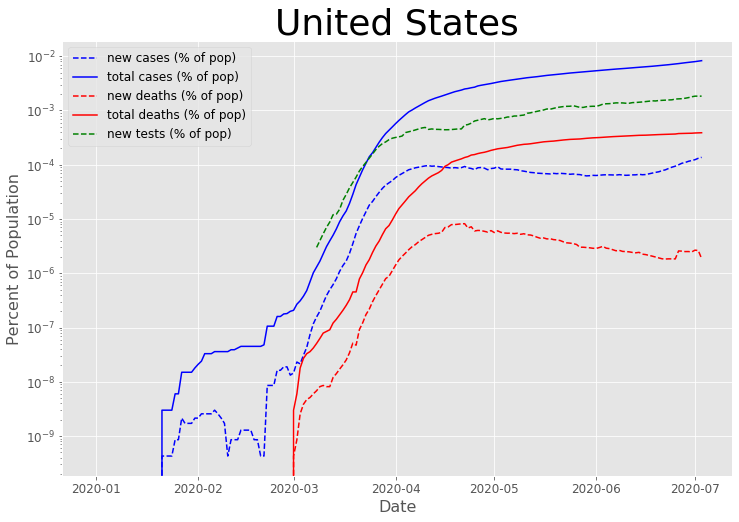

In [6]:
plot_country(df, 'United States', plot_tests=True)

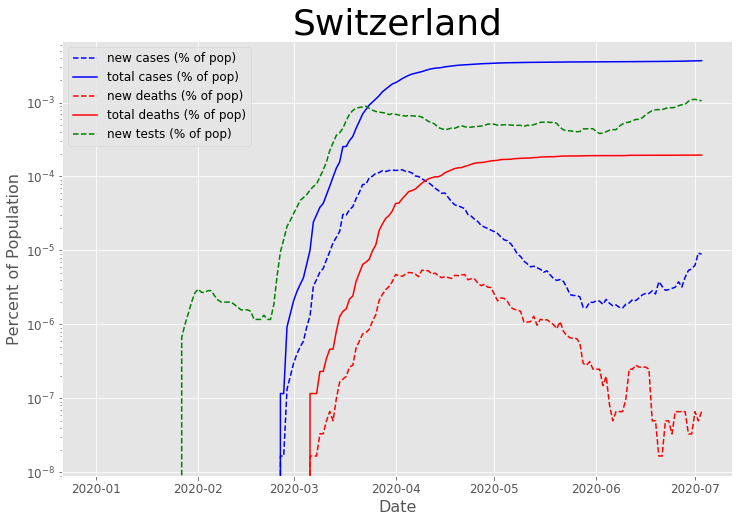

In [5]:
plot_country(df, 'Switzerland', plot_tests=True)

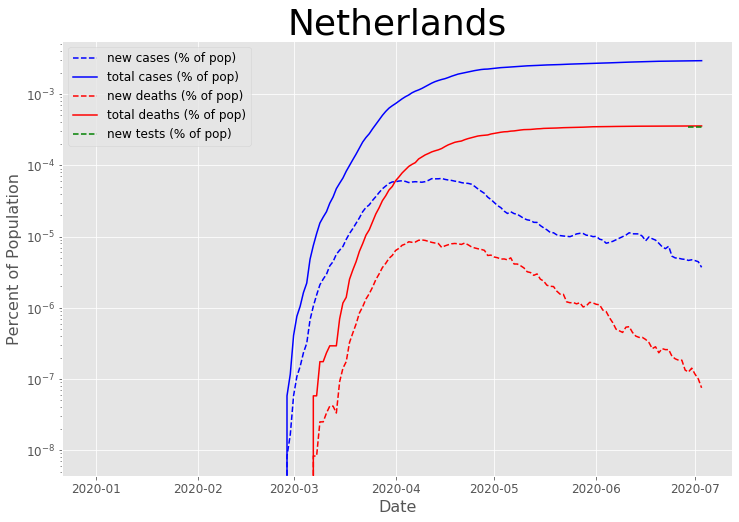

In [160]:
plot_country(df, 'Netherlands', plot_tests=True)

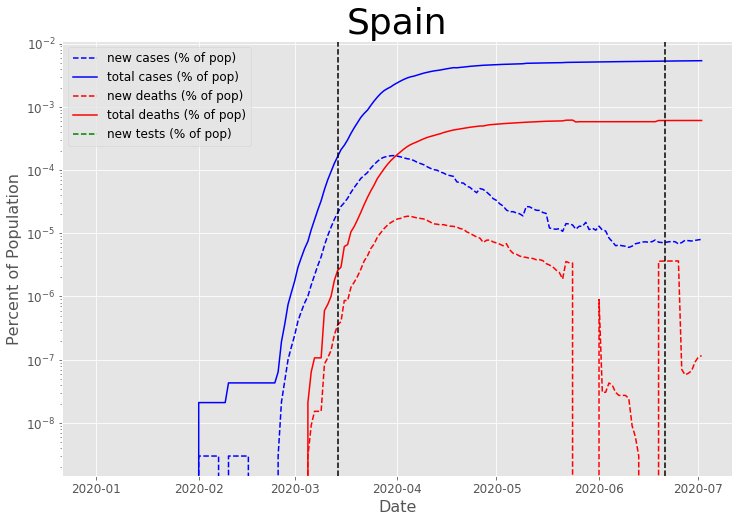

In [158]:
plot_country(df, 'Spain', ['3/14/2020', '6/21/2020'], plot_tests=True)

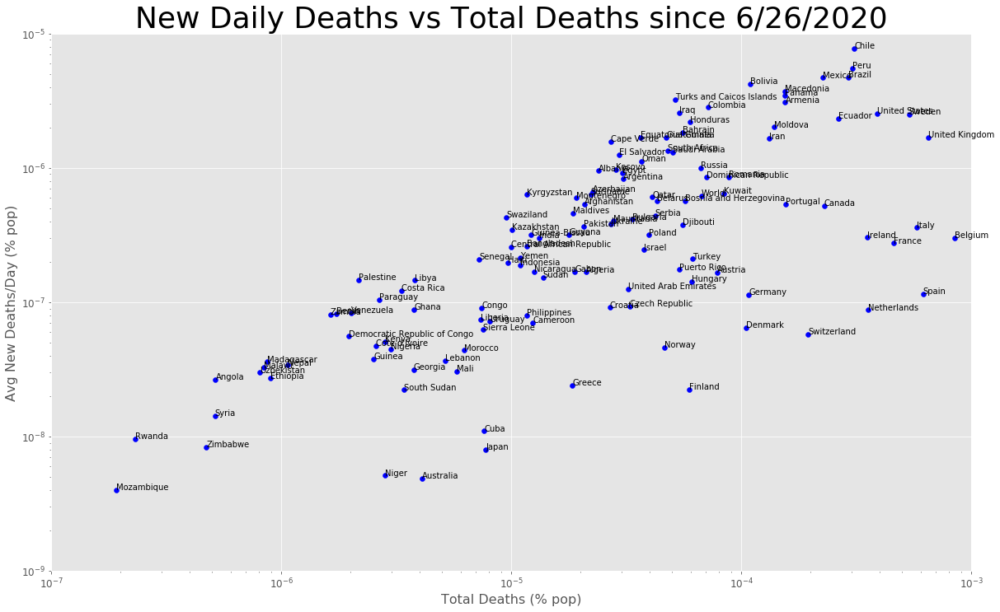

In [169]:
date_cutoff = '6/26/2020'

total_deaths = df.groupby(['location'])['total_deaths_per_million'].max().reset_index()
recent = df.loc[df['date']>=pd.to_datetime(date_cutoff)]
recent_new_deaths = recent.groupby(['location'])['new_deaths_per_million'].mean().reset_index()
deaths = pd.merge(left=total_deaths, right=recent_new_deaths, on=['location'])
deaths['new_deaths'] = deaths['new_deaths_per_million']/1e6
deaths['total_deaths'] = deaths['total_deaths_per_million']/1e6

fig = plt.figure(figsize=(20,12))
ax = fig.add_subplot(111)
ax.scatter(deaths['total_deaths'], deaths['new_deaths'], color='blue')
ax.set_xlim([1e-7, 1e-3])
ax.set_ylim([1e-9, 1e-5])

ax.set_xlabel('Total Deaths (% pop)')
ax.set_ylabel('Avg New Deaths/Day (% pop)')
ax.set_title(f'New Daily Deaths vs Total Deaths since {date_cutoff}')

#labeled_countries = ['France', 'Italy', 'United States']
labeled_countries = deaths['location'].unique()
for c in labeled_countries:
    x = deaths.loc[deaths['location']==c, 'total_deaths'].values[0]
    y = deaths.loc[deaths['location']==c, 'new_deaths'].values[0]
    if x>1e-7 and y>1e-9:
        ax.text(x, y, c)

ax.set_xscale('log')
ax.set_yscale('log')

fig.savefig('plots/all_countries_scatter.png')

plt.show()

In [176]:
def plot_deaths(df, countries, legend=True, name=None):
    fig = plt.figure(figsize=(12,8))
    ax = fig.add_subplot(111)
    for c in countries:
        df_c = df.loc[df['location']==c]
        ax.plot(df_c['total_deaths_per_million']/1e6, df_c['new_deaths_per_million_moving_avg']/1e6, label=c)
    if legend:
        ax.legend()
    total_deaths = df.groupby(['location'])['total_deaths_per_million'].max().reset_index()

    ax.set_xlim([1e-7, 1e-2])
    ax.set_ylim([1e-9, 1e-4])

    ax.set_xlabel('Total Deaths (% pop)')
    ax.set_ylabel('New Deaths/Day (% pop)')
    ax.set_title('New Deaths vs Total Deaths Trajectory')

    ax.set_xscale('log')
    ax.set_yscale('log')
    
    if name is not None:
        fig.savefig(f'plots/{name}')

    plt.show()

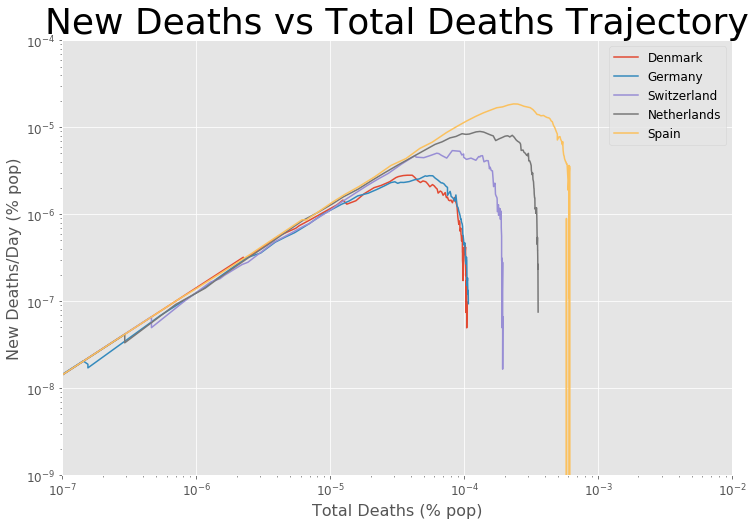

In [177]:
plot_deaths(df, ['Denmark', 'Germany', 'Switzerland', 'Netherlands', 'Spain'], name='lower_right.png')

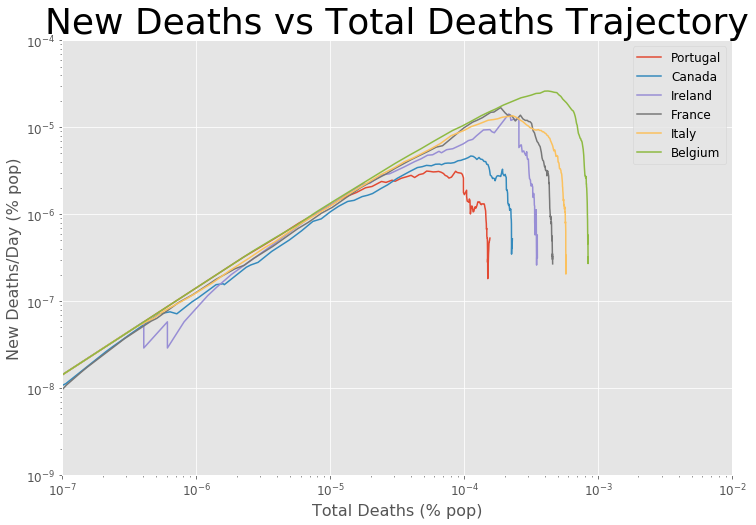

In [178]:
plot_deaths(df, ['Portugal', 'Canada', 'Ireland', 'France', 'Italy', 'Belgium'], name='middle_right.png')

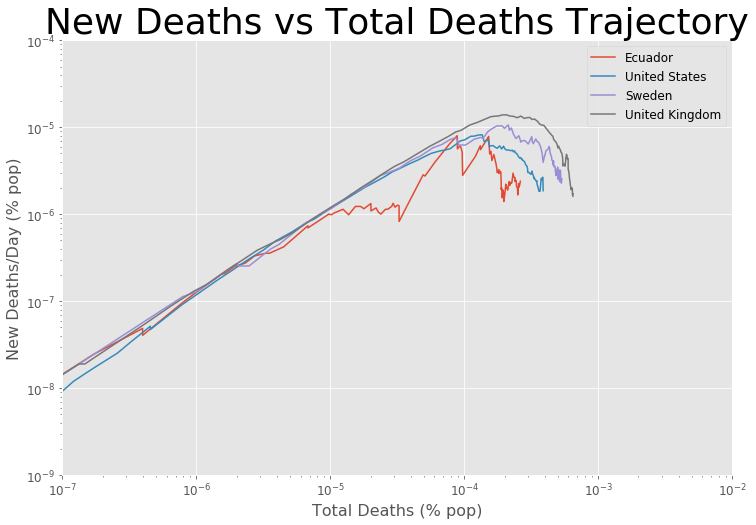

In [181]:
plot_deaths(df, ['Ecuador', 'United States', 'Sweden', 'United Kingdom'], name='upper_right')

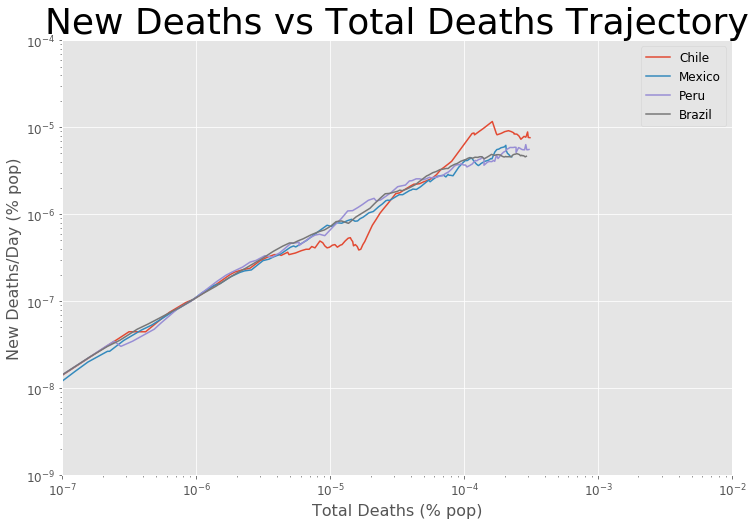

In [184]:
plot_deaths(df, ['Chile', 'Mexico', 'Peru', 'Brazil'], name='far_upper_right.png')

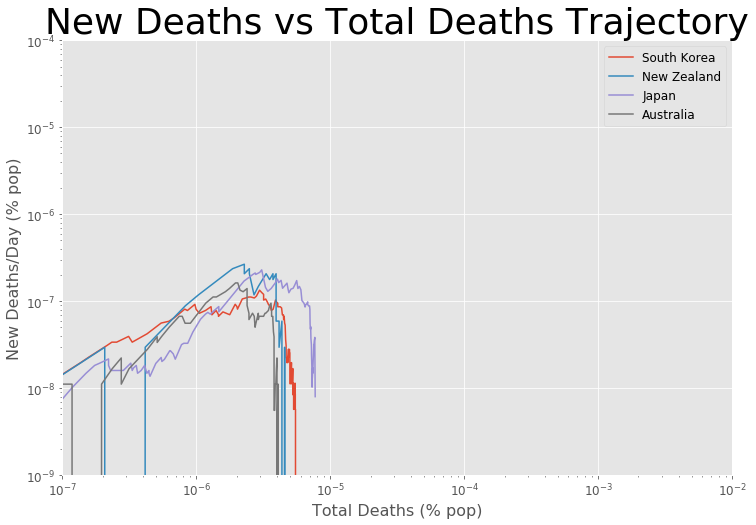

In [187]:
plot_deaths(df, ['South Korea', 'New Zealand', 'Japan', 'Australia'], name='eradicated.png')

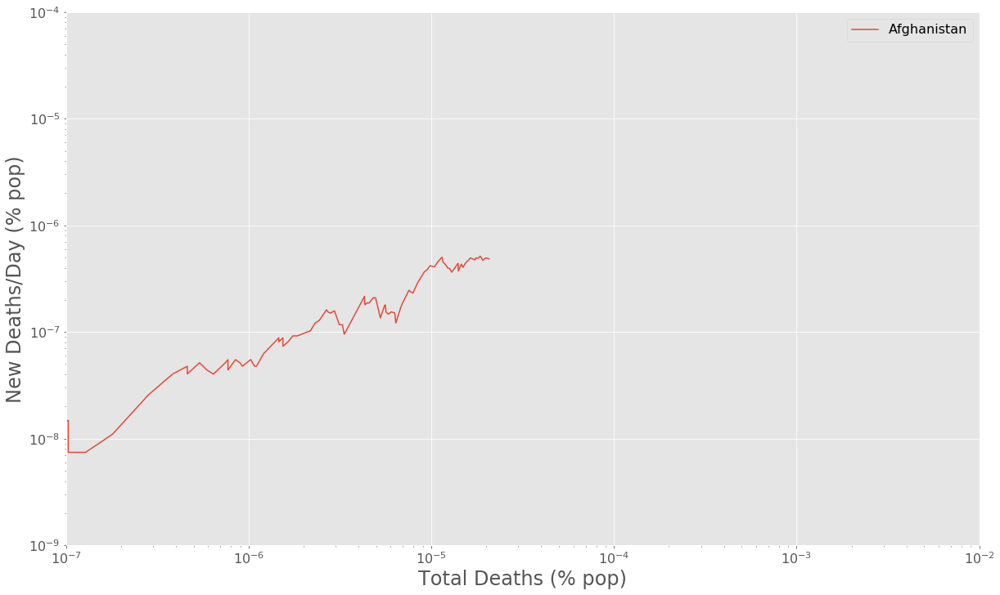

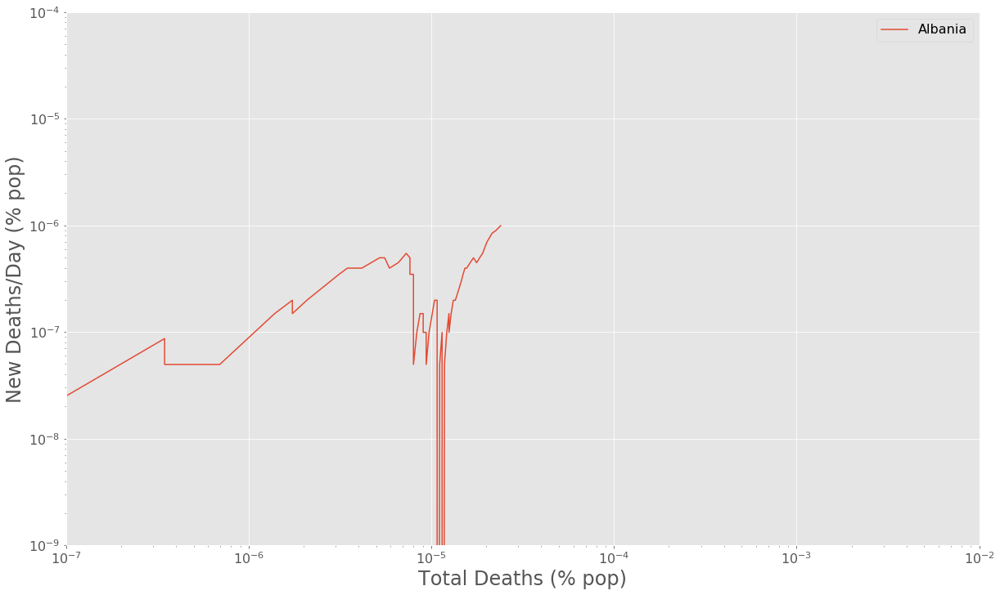

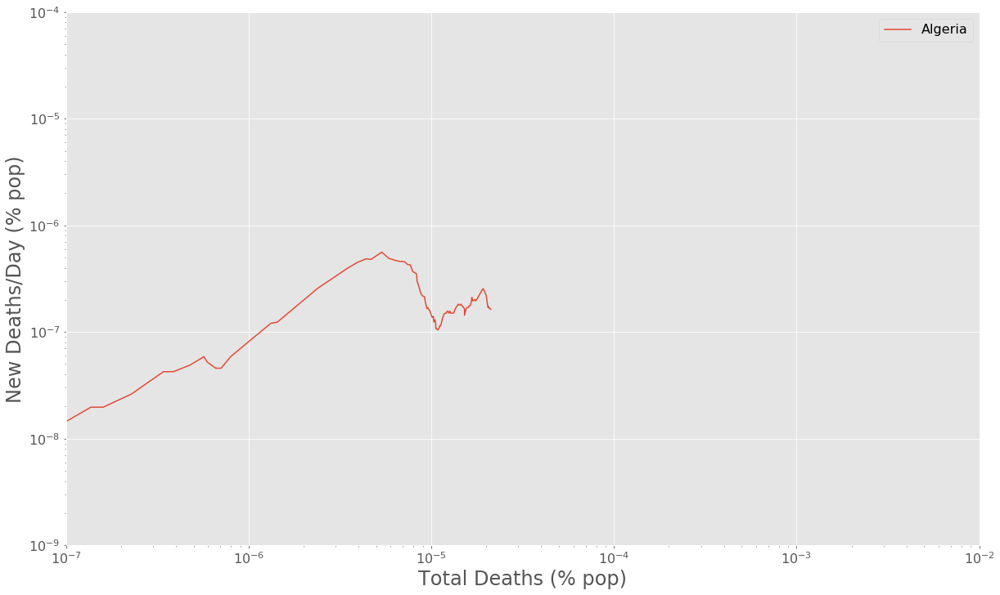

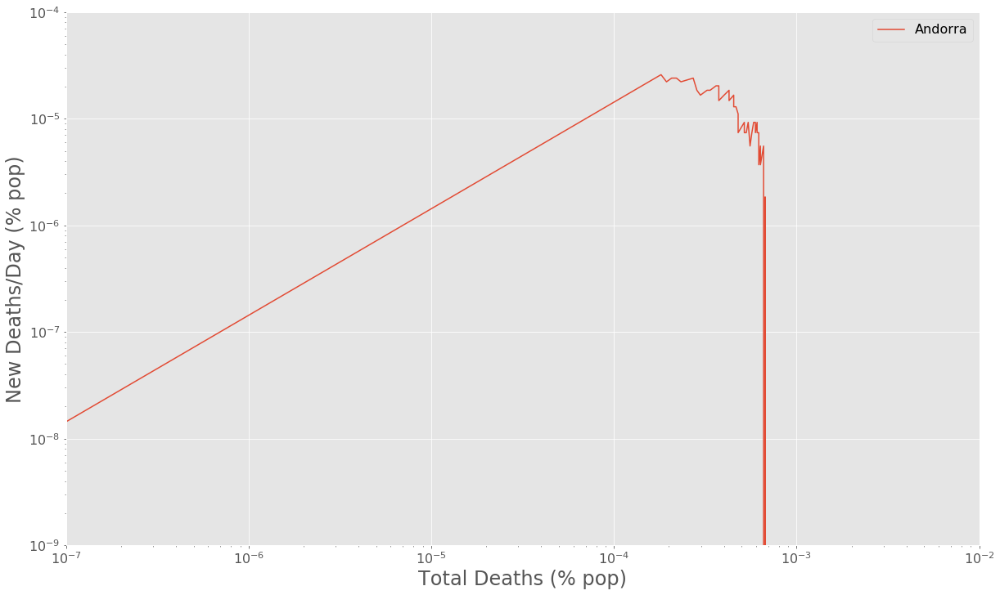

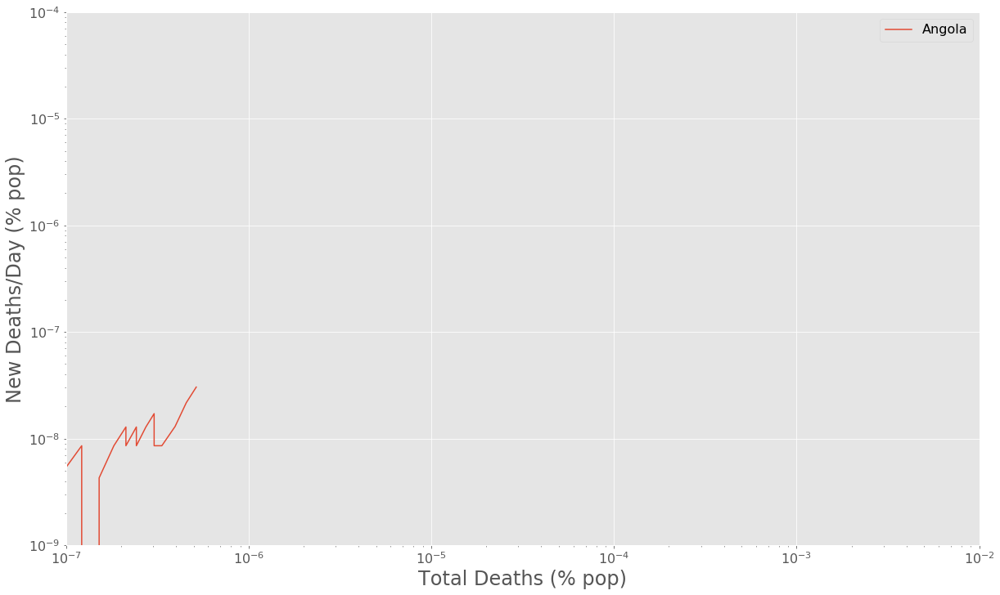

...

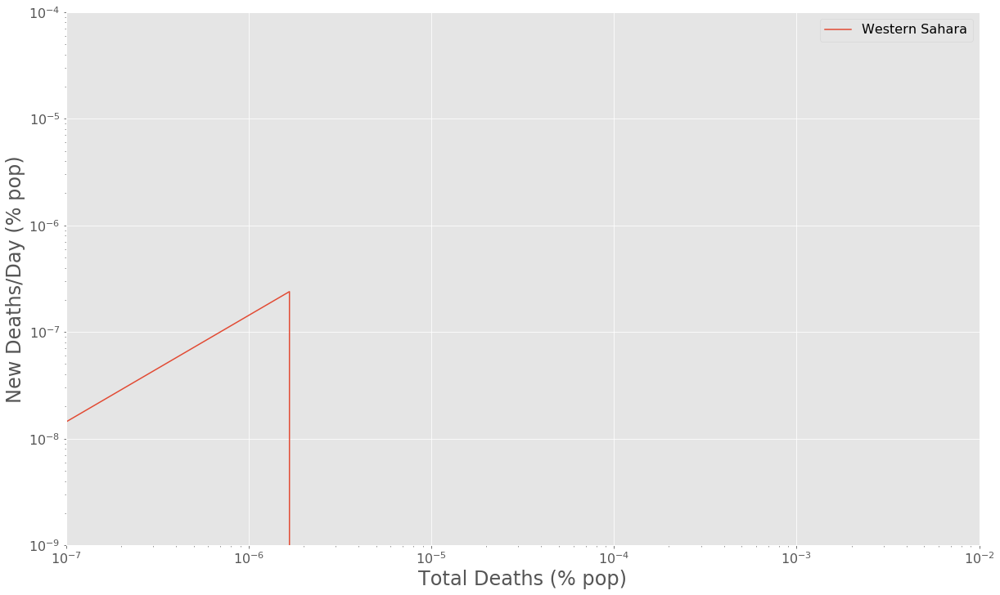

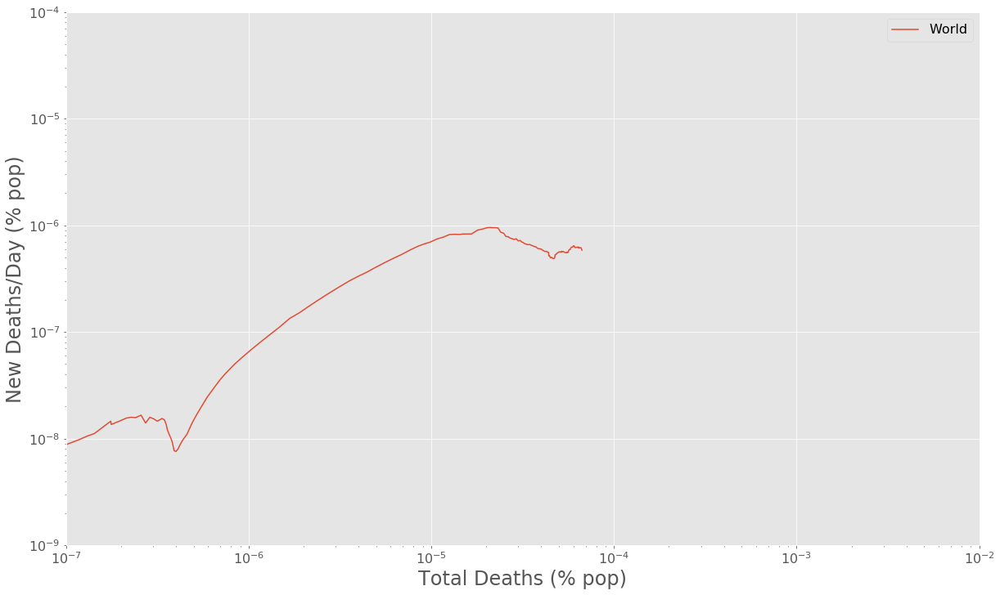

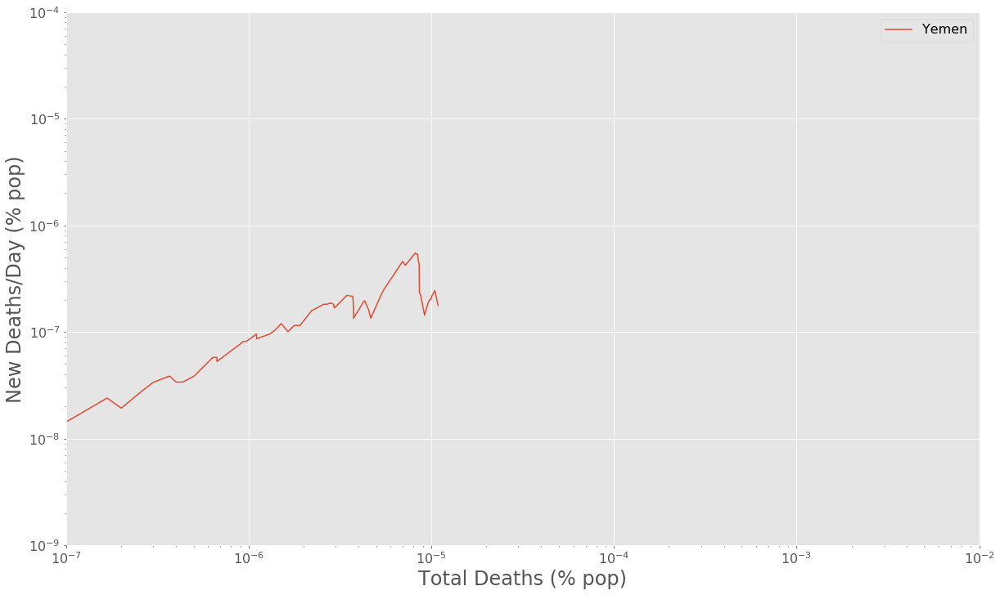

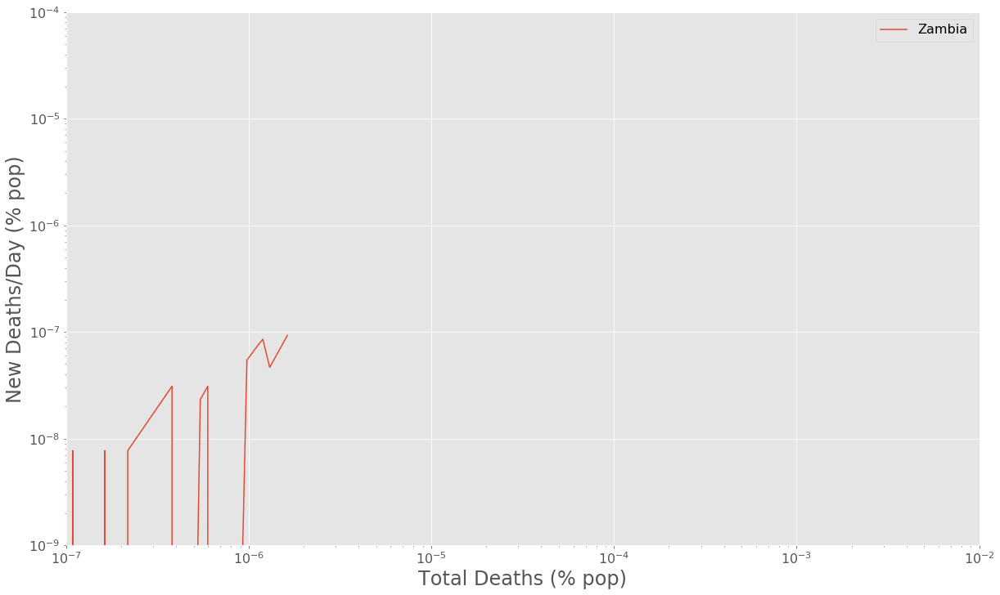

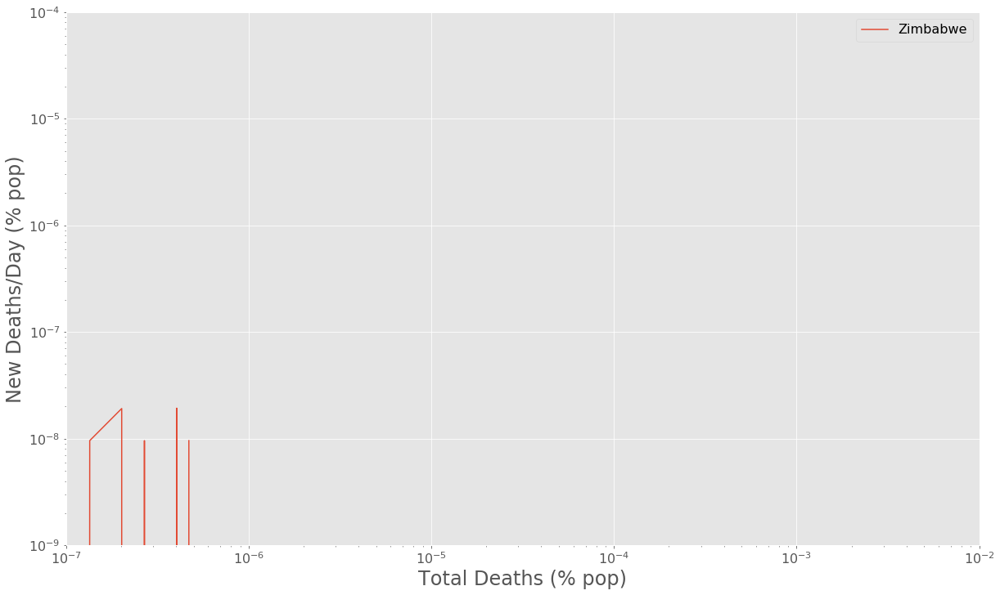

In [128]:
for country in df['location'].unique():
    plot_deaths(df, [country])